# Load the data

In [1]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np
import pandas as pd
import audioread
import os
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchinfo import summary
import warnings
warnings.filterwarnings("ignore")

#custom import
from audio_process import process_csv,process_full_data, get_prediction, download_audio, display_video
from audio_process import predict_on_audio,getMELspectrogram
from utils import display_audio_grid, view_class_dist, get_weights
from utils import train_and_test, load_model
from utils import get_confusion_matrix, plot_confusion_matrix, display_all_scores
import random
import librosa
import librosa.display

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# this will make your code repetable to a great extend
def seed_everything(seed=1234):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything()

NVIDIA GeForce RTX 2070 Super


# EDA for Audio

- If Duration is high, the size of the dataset increases drastically. Make sure to keep this in moderate range ~10 sec. Experiment with different values.

- The excel file where we register Youtube URLs have inconsistent cells. Make sure to have all lower case, no white space etc. 

- You can also play with the number of Mel frequency bands *n_mels* to get a better results without running out of memory

In [2]:
SAMPLE_RATE = 48000

- This is the excel file having Youtube urls. 

In [3]:
data = pd.read_csv("speech_urls.csv")
data.head()

,label,party,person,speech_url
0,Center,Liberal Democrats,Ed Davey,https://www.youtube.com/live/Ui0tL74pn3U?featu...
1,Center,Liberal Democrats,Ed Davey,https://youtu.be/IbK02g6ZQAI
2,Center,Liberal Democrats,Liz Truss,https://youtu.be/pLOEwXHP8HI?t=14
3,Center,Liberal Democrats,Liz Truss,https://youtu.be/m36OmLnYbgw
4,Center,Labour,Keir Starmer,https://youtu.be/KF4UNqBejxk?t=132


- Do some cleaning to the original csv file.

In [4]:
#remove white space and lower the characters
data['party'] = data['party'].apply(lambda x: x.replace(' ', '_').lower())
data['person'] = data['person'].apply(lambda x: x.replace(' ', '_').lower())
data['label'] = data['label'].apply(lambda x: x.replace(' ', '').lower())

# Assign unique IDs to labels
label_ids, unique_labels = pd.factorize(data['label'])

# Add ID column to DataFrame
data['id'] = label_ids

# some class stuff
idx_to_class = dict(enumerate(unique_labels))
class_to_idx = {v: k for k, v in idx_to_class.items()}
class_list = list(idx_to_class.values())
num_classes = len(class_list)

data.head()

,label,party,person,speech_url,id
0,center,liberal_democrats,ed_davey,https://www.youtube.com/live/Ui0tL74pn3U?featu...,0
1,center,liberal_democrats,ed_davey,https://youtu.be/IbK02g6ZQAI,0
2,center,liberal_democrats,liz_truss,https://youtu.be/pLOEwXHP8HI?t=14,0
3,center,liberal_democrats,liz_truss,https://youtu.be/m36OmLnYbgw,0
4,center,labour,keir_starmer,https://youtu.be/KF4UNqBejxk?t=132,0


In [5]:
data.label.unique()

array(['center', 'right', 'left'], dtype=object)

In [6]:
#check if there is any duplicates
data.party.unique()

array(['liberal_democrats', 'labour', 'conservative',
       'democratic_unionist_party_', 'reform_uk', 'green_party',
       'green_party_of_england_and_whales', 'scottish_national_party'],
      dtype=object)

In [ ]:
data.person.unique()

In [7]:
#we need these for processing
class_to_idx = {label: idx for label, idx in zip(data['label'].unique(), data['id'].unique())}
idx_to_class = {v: k for k, v in class_to_idx.items()}
# class_list = list(idx_to_class.keys())
# num_classes = len(class_list)
# #print some useful stuff
print(class_to_idx)

{'center': 0, 'right': 1, 'left': 2}


- This is the driver function to create our music genre dataset. It does the following behind the scene:


1.   Loop over the rows of 'temp.csv' and download the video from the url.
2.   Convert the video to audio by considering "max_duration" mins from the beginning. 
3.   Split the audio into chunks of "split_length" seconds.
4.   Copy all the chunks from (3) to its respective "label" folder.  


For example, if the audio is 4 mins and we set max_duration=3, split_length=30, we will get 3*60/30=6 chunks(data points) per speech. 


- If the download fails, the code ignore that row and moves to the next row. 


- If everything goes smootly, we should see "speech_data" folder including genre folder with audio files and "final_speech_dataframe.csv" dataframe having label, path of those labels and IDs of them. You better grab a coffee,it may take upto 10 mins or so.

In [ ]:
# max_duration = 5
# split_length = 30

# process_csv(dataframe=data,class_to_idx=class_to_idx,root_dir="speech_data",
#             max_duration=max_duration,split_length=split_length)


In [8]:
data = pd.read_csv("speech_dataframe.csv")
data.head()

,label,path,id
0,center,speech_data/center/liberal_democrats_ed_davey_...,0
1,center,speech_data/center/liberal_democrats_ed_davey_...,0
2,center,speech_data/center/liberal_democrats_ed_davey_...,0
3,center,speech_data/center/liberal_democrats_ed_davey_...,0
4,center,speech_data/center/liberal_democrats_ed_davey_...,0


In [9]:
data['label'].value_counts()

right     161
center    113
left       92
Name: label, dtype: int64

- **Rest of the code assumes that we have exactly the structure above. Otherwise, nothing will work!**

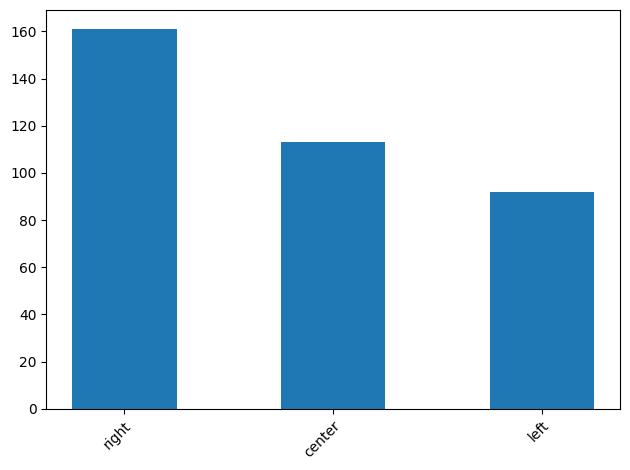

In [10]:
view_class_dist(data)

In [11]:
#let's see some samples
display_audio_grid(df=data,n=3)

'center'

'right'

'left'

# Augment Audio Files

This is what we are feeding to the model.

MEL spectrogram shape:  (128, 563)


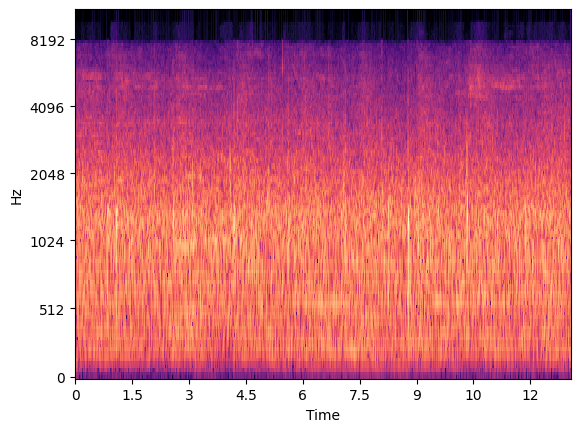

In [13]:
audio, sample_rate = librosa.load(data.loc[1,'path'], duration=3, offset=2,sr=SAMPLE_RATE)
mel_spectrogram = getMELspectrogram(audio)
librosa.display.specshow(mel_spectrogram, y_axis='mel', x_axis='time')
print('MEL spectrogram shape: ',mel_spectrogram.shape)

- Read and process the audio files and create train and testing files.

- **train_audio_duration**(sec) is the fixed length of each audio to fed into our model. If this is high, we run out of memory.

- **train_audio_offset**(sec) represents the time after which we start considering the audio.

- With the options below, each Mel-spec shape becomes (128, 938). This gives us a decent accuracy. Experiment with different numbers 

In [14]:
train_audio_duration = 5
train_audio_offset = 5
X_train, Y_train, X_test, Y_test, (mean, std) = process_full_data(data, duration=train_audio_duration, offset=train_audio_offset)

loading 366/366 audio files
data loaded...

after split X_train: (292, 240000)

adding AWGN noise 292/292 files
after noise augmented X_train: (876, 240000)


calculating mel spectrograms for 876 files
processed 876/876 files

calculating mel spectrograms for 74 files
processed 74/74 files

after mel-spec X_train: (876, 128, 938)


scaled the data
finished processing dataset

X_train:(876, 1, 128, 938) Y_train:(876,)

X_test:(74, 1, 128, 938) Y_test:(74,)



# Create the model

In [15]:
class ParallelModel(nn.Module):
    def __init__(self,num_classes):
        super().__init__()
        # conv block
        self.conv2Dblock = nn.Sequential(
            # 1. conv block
            nn.Conv2d(in_channels=1,
                       out_channels=16,
                       kernel_size=3,
                       stride=1,
                       padding=1
                      ),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(p=0.3),
            # 2. conv block
            nn.Conv2d(in_channels=16,
                       out_channels=32,
                       kernel_size=3,
                       stride=1,
                       padding=1
                      ),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4),
            nn.Dropout(p=0.3),
            # 3. conv block
            nn.Conv2d(in_channels=32,
                       out_channels=64,
                       kernel_size=3,
                       stride=1,
                       padding=1
                      ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4),
            nn.Dropout(p=0.3),
            # 4. conv block
            nn.Conv2d(in_channels=64,
                       out_channels=64,
                       kernel_size=3,
                       stride=1,
                       padding=1
                      ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4),
            nn.Dropout(p=0.3)
        )
        # Transformer block
        self.transf_maxpool = nn.MaxPool2d(kernel_size=[2,4], stride=[2,4])
        transf_layer = nn.TransformerEncoderLayer(d_model=64, nhead=4, dim_feedforward=512, dropout=0.4, activation='relu')
        self.transf_encoder = nn.TransformerEncoder(transf_layer, num_layers=4)
        # Linear softmax layer
        self.out_linear = nn.Linear(512,num_classes)
        self.dropout_linear = nn.Dropout(p=0)
        self.out_softmax = nn.Softmax(dim=1)
    def forward(self,x):
        # conv embedding
        conv_embedding = self.conv2Dblock(x) #(b,channel,freq,time)
        conv_embedding = torch.flatten(conv_embedding, start_dim=1) # do not flatten batch dimension
        #print("Conv embedding shape:", conv_embedding.shape)
        # transformer embedding
        x_reduced = self.transf_maxpool(x)
        x_reduced = torch.squeeze(x_reduced,1)
        x_reduced = x_reduced.permute(2,0,1) # requires shape = (time,batch,embedding)
        transf_out = self.transf_encoder(x_reduced)
        transf_embedding = torch.mean(transf_out, dim=0)
        #print("Transf embedding shape:", transf_embedding.shape)
        # concatenate
        complete_embedding = torch.cat([conv_embedding, transf_embedding], dim=1) 
        # final Linear
        output_logits = self.out_linear(complete_embedding)
        output_logits = self.dropout_linear(output_logits)
        output_softmax = self.out_softmax(output_logits)
        return output_logits
                                     

In [17]:
model = ParallelModel(num_classes=3)
summary(model,(8, 1, 128, 938))

Layer (type:depth-idx)                        Output Shape              Param #
ParallelModel                                 [8, 3]                    --
├─Sequential: 1-1                             [8, 64, 1, 7]             --
│    └─Conv2d: 2-1                            [8, 16, 128, 938]         160
│    └─BatchNorm2d: 2-2                       [8, 16, 128, 938]         32
│    └─ReLU: 2-3                              [8, 16, 128, 938]         --
│    └─MaxPool2d: 2-4                         [8, 16, 64, 469]          --
│    └─Dropout: 2-5                           [8, 16, 64, 469]          --
│    └─Conv2d: 2-6                            [8, 32, 64, 469]          4,640
│    └─BatchNorm2d: 2-7                       [8, 32, 64, 469]          64
│    └─ReLU: 2-8                              [8, 32, 64, 469]          --
│    └─MaxPool2d: 2-9                         [8, 32, 16, 117]          --
│    └─Dropout: 2-10                          [8, 32, 16, 117]          --
│    └─Conv2d: 2

# Train-Test

In [18]:
model = ParallelModel(num_classes=len(idx_to_class))

# define datasets
train_dataset = TensorDataset(torch.from_numpy(X_train).float().to(device), torch.from_numpy(Y_train).long().to(device))
test_dataset = TensorDataset(torch.from_numpy(X_test).float().to(device), torch.from_numpy(Y_test).long().to(device))

# define sampler to account for imbalanced data
class_weights, sample_weights = get_weights(train_dataset)
sampler = torch.utils.data.sampler.WeightedRandomSampler(sample_weights, len(sample_weights))

# create data loaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, sampler=sampler)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# define optimizer and lr. Experiment with different numbers
learning_rate = 5e-3
weight_decay = 5e-4/2
optimizer = optim.SGD(model.parameters(),lr=learning_rate, weight_decay=0., momentum=0.8)

In [19]:
num_epochs = 30
log_int = 5
train_and_test(model, train_loader, test_loader, optimizer, num_epochs=num_epochs, log_int=log_int,
                   class_weights=class_weights, save_best=True, save_dir='./runs')

improved! epoch: 1/30 train_acc: 42.35%, test_acc: 40.54%
improved! epoch: 2/30 train_acc: 46.80%, test_acc: 47.30%
improved! epoch: 3/30 train_acc: 48.74%, test_acc: 50.00%
improved! epoch: 4/30 train_acc: 52.97%, test_acc: 56.76%
epoch: 5/30 train_acc: 52.17%,test_acc: 45.95%
improved! epoch: 8/30 train_acc: 56.28%, test_acc: 70.27%
epoch: 10/30 train_acc: 57.99%,test_acc: 67.57%
epoch: 15/30 train_acc: 63.81%,test_acc: 68.92%
epoch: 20/30 train_acc: 68.49%,test_acc: 71.62%
improved! epoch: 20/30 train_acc: 68.49%, test_acc: 71.62%
improved! epoch: 22/30 train_acc: 67.81%, test_acc: 72.97%
improved! epoch: 23/30 train_acc: 70.55%, test_acc: 74.32%
epoch: 25/30 train_acc: 72.15%,test_acc: 77.03%
improved! epoch: 25/30 train_acc: 72.15%, test_acc: 77.03%
improved! epoch: 29/30 train_acc: 71.58%, test_acc: 79.73%
epoch: 30/30 train_acc: 71.35%,test_acc: 81.08%
improved! epoch: 30/30 train_acc: 71.35%, test_acc: 81.08%
best testing accuracy: 81.1


0.811

# Performance Evaluation

In [20]:
model_path = "runs/best_model.pth"
model= load_model(model,model_path)
print(model.best_scores)

{'batch_size': 8, 'learning_rate': 0.005, 'weight_decay': 0.0, 'optimizer': 'SGD', 'best_acc': 0.811}


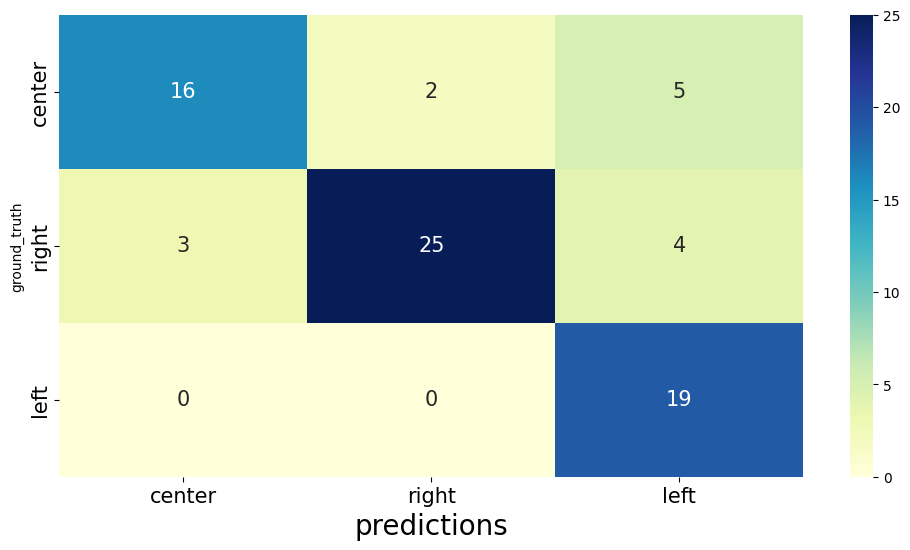

In [21]:
cm = get_confusion_matrix(model, test_loader)
plot_confusion_matrix(cm, class_list)

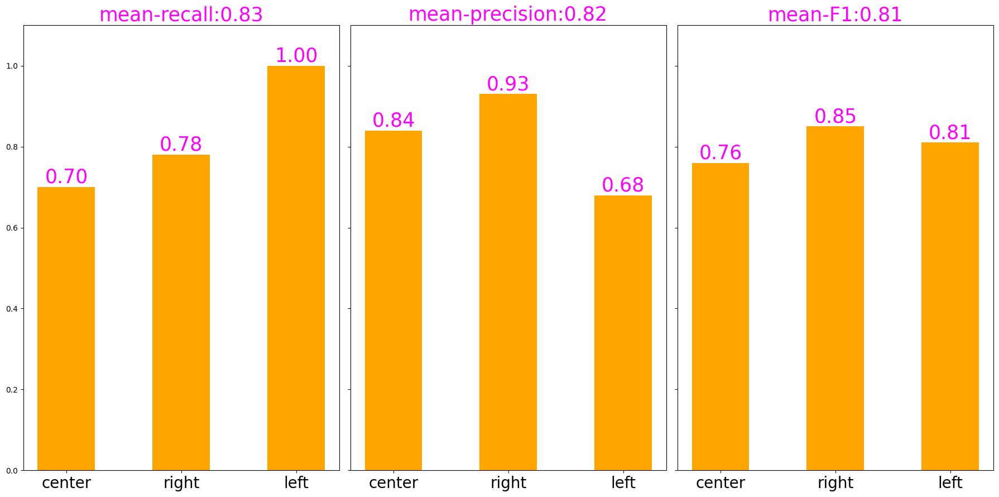

In [22]:
display_all_scores(cm,class_list)

# Analyze Long Audio

- In this section, we will experiment with different politicians from different spectrumns to see how the model is doing. We will analyse a speech from [Mr. Peter Robinson](https://en.wikipedia.org/wiki/Peter_Robinson_(Northern_Ireland_politician)) who is affiliated with right-leaning Democratic Unionist Party. The following is his resignation speech.

- You can simply analyze any speech by adding its youtube URL below. The model is far from perfect but fun to watch(:(:

In [43]:
audio_name = 'peter-robinson'
video_url = "https://youtu.be/LS1H7k3OzEg"
download_audio(video_url=video_url,audio_name=audio_name)

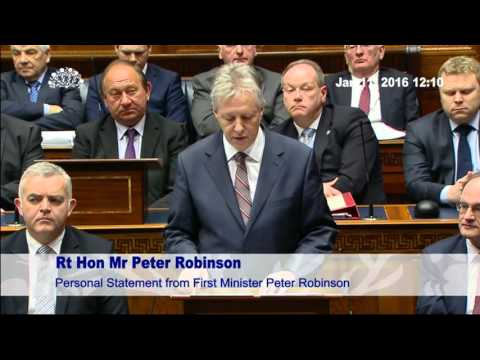

In [44]:
display_video(video_url=video_url)

done!


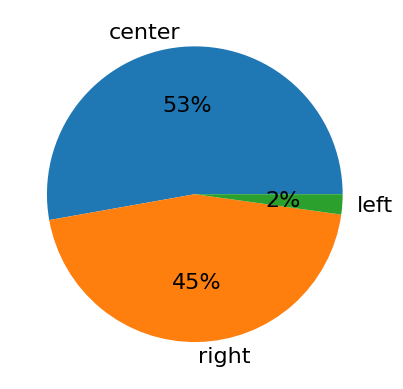

In [45]:
offset = 10
predict_on_audio(model=model, audio_path=audio_name, mean=mean, std=std, idx_to_class=idx_to_class,
                 window_size=train_audio_duration, offset=offset, hop_size=1, save_anime=True)

**RESOURCES**
                                                                        
- Backbone of this project is the GitHub repo [Speech-Emotion-Classification-with-PyTorch](https://github.com/Data-Science-kosta/Speech-Emotion-Classification-with-PyTorch). Our preprocessing operations as well as the transformer model are cloned from this library.